In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


def weights_init(w):
    """
    Initializes the weights of the layer, w.
    """
    classname = w.__class__.__name__
    if classname.find('conv') != -1:
        nn.init.normal_(w.weight.data, 0.0, 0.02)
    elif classname.find('bn') != -1:
        nn.init.normal_(w.weight.data, 1.0, 0.02)
        nn.init.constant_(w.bias.data, 0)


#TODO!! Part 2. Finish the following two definition of classes to define Generator and Discriminitor model structure
# Define the Generator Network
class Generator(nn.Module):
    def __init__(self, params):
        super().__init__()

        # Input is the latent vector Z.

        #TODO!! Define layers here
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(params['nz'], params['ngf'] * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(params['ngf'] * 4),
            nn.ReLU(),

            nn.ConvTranspose2d(params['ngf'] * 4, params['ngf'] * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ngf'] * 2),
            nn.ReLU(),

            nn.ConvTranspose2d(params['ngf'] * 2, params['ngf'], 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ngf']),
            nn.ReLU(),

            nn.ConvTranspose2d(params['ngf'], 1, 4, 2, 1, bias=False),
            nn.Tanh()

        )

    def forward(self, x):
        #TODO!! Define how the data flows in Generator
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self, params):
        super().__init__()
        # Input Dimension: (nc) x 32 x 32
        #TODO!! Define layers here
        self.main = nn.Sequential(
            nn.Conv2d(params['nc'], params['ndf'], 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ndf']),
            nn.ReLU(),

            nn.Conv2d(params['ndf'], params['ndf'] * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ndf'] * 2),
            nn.ReLU(),

            nn.Conv2d(params['ndf'] * 2, params['ndf'] * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ndf'] * 4),
            nn.ReLU(),

            nn.Conv2d(params['ndf'] * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )



    def forward(self, x):
        #TODO!! Define how the data flows in Discriminator
        return self.main(x)


In [ ]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as dset
from PIL import Image

# TODO!!! Directory containing the data.
#
root = '/content/drive/MyDrive/AIML431/project4/emnist_jpeg/Train'
def get_EMNIST(params):
    #TODO! Part 1. Complete the data_loader and ensure it can successfully load images from your folder
    enlarged_size = int(1.1 * params['imsize']) #image_size is 32
    canvas_size = [enlarged_size, enlarged_size]
    transform = transforms.Compose([
        transforms.Resize((params['imsize'],params['imsize']), Image.BICUBIC),
        transforms.ToTensor(),
        transforms.Normalize((0.5), (0.5)),
        transforms.Grayscale(num_output_channels=params['nc']),
        # TODO! Add some processing transforms for data augmentation

        transforms.Resize(canvas_size, Image.BICUBIC),
        transforms.RandomCrop(params['imsize']), #Randomly crop a 32*32 image
        transforms.RandomHorizontalFlip(), #Randomly flip the images
        ])

    # Create the dataset.
    dataset = dset.ImageFolder(root=root, transform=transform)

    # Create the dataloader.
    dataloader = torch.utils.data.DataLoader(dataset,
        batch_size=params['bsize'],
        shuffle=True)

    return dataloader


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import matplotlib.animation as animation
from IPython.display import HTML
import torchvision.utils as vutils

# from utils import get_EMNIST
# from dcgan import weights_init, Generator, Discriminator

# Random seeds to ensure reproducibility.
seed = 369
random.seed(seed)
torch.manual_seed(seed)
print("Random Seed: ", seed)

# Parameters to define for the program
#TODO!!! Change the parameters according to your own needs
params = {
    "bsize" : 32,# Batch size during training.
    'imsize' : 32,# Spatial size of training images. All images will be resized to this size during preprocessing.
    'nc' : 1,# Number of channles in the training images. For greyscale images this is 3.
    'nz' : 100,# Size of the Z latent vector (the input to the generator).
    'ngf' : 64,# Size of feature maps in the generator. The depth will be multiples of this.
    'ndf' : 64, # Size of features maps in the discriminator. The depth will be multiples of this.
    'nepochs' : 100,# Number of training epochs.
    'lr' : 0.0005,# Learning rate for optimizers
    'beta1' : 0.5,# Beta1 hyperparam for Adam optimizer
    'save_epoch' : 10, # Save step.
    'label_dim' : 2} #For the conditional DCGAN

# Use GPU if cuda is available, else use CPU.
device = torch.device("cuda:0" if(torch.cuda.is_available()) else "cpu")
#device = torch.device("cpu")
#Use the above code if GPU is not available

# Get the data.
dataloader = get_EMNIST(params)
num_epochs = params['nepochs']

#The help function to plot the loss trend
def plot_loss(d_losses, g_losses, num_epoch, save=False, save_dir='/content/drive/MyDrive/AIML431/project4/model/DCGAN_results/', show=False):
    fig, ax = plt.subplots()
    ax.set_xlim(0, num_epochs)
    ax.set_ylim(0, max(np.max(g_losses), np.max(d_losses))*1.1)
    plt.xlabel('Epoch {0}'.format(num_epoch + 1))
    plt.ylabel('Loss values')
    plt.plot(d_losses, label='Discriminator')
    plt.plot(g_losses, label='Generator')
    plt.legend()

    # save figure
    if save:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_fn = save_dir + 'DCGAN_losses_epoch_{:d}'.format(num_epoch + 1) + '.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

#The help function for plotting results
def plot_result(generator, noise, num_epoch, save=False, save_dir='DCGAN_results/', show=True, fig_size=(5, 5)):
    #TODO!!! Call the model G (generator) properly to generate images from noises (Part 3.3)
    generator.eval()
    gen_image = generator(noise)
    #Important! If you are calling this plot result function during training,
    # don't forget to change the model mode from eval() to train().
    generator.train()
    n_rows = np.sqrt(noise.size()[0]).astype(np.int32)
    n_cols = np.sqrt(noise.size()[0]).astype(np.int32)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=fig_size)
    for ax, img in zip(axes.flatten(), gen_image):
        ax.axis('off')
        ax.adjustable = 'box-forced'
        img = (((img - img.min()) * 255) / (img.max() - img.min())).cpu().data.numpy().transpose(1, 2, 0).astype(np.uint8)
        ax.imshow(img.astype(np.uint8), cmap='Greys_r') # The default grey scale visualization is reversed. Using "_r" to show the correct scale
    plt.subplots_adjust(wspace=0, hspace=0)
    title = 'Epoch {0}'.format(num_epoch+1)
    fig.text(0.5, 0.04, title, ha='center')

    # save figure
    if save:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_fn = save_dir + 'DCGAN_epoch_{:d}'.format(num_epoch+1) + '.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

Random Seed:  369


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)
Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(64, 128, ke

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


[0/100][0/75]	Loss_D: 1.3297	Loss_G: 2.3452	D(x): 0.5758	D(G(z)): 0.5301 / 0.0983
[0/100][10/75]	Loss_D: 0.0905	Loss_G: 5.1528	D(x): 0.9522	D(G(z)): 0.0388 / 0.0063
[0/100][20/75]	Loss_D: 0.0307	Loss_G: 6.6362	D(x): 0.9846	D(G(z)): 0.0144 / 0.0015
[0/100][30/75]	Loss_D: 0.0119	Loss_G: 7.1492	D(x): 0.9953	D(G(z)): 0.0071 / 0.0009
[0/100][40/75]	Loss_D: 0.0648	Loss_G: 4.9558	D(x): 0.9592	D(G(z)): 0.0075 / 0.0075
[0/100][50/75]	Loss_D: 0.0179	Loss_G: 5.0569	D(x): 0.9939	D(G(z)): 0.0115 / 0.0082
[0/100][60/75]	Loss_D: 0.1041	Loss_G: 7.1063	D(x): 0.9398	D(G(z)): 0.0367 / 0.0009
[0/100][70/75]	Loss_D: 0.1180	Loss_G: 8.5088	D(x): 0.9736	D(G(z)): 0.0810 / 0.0004


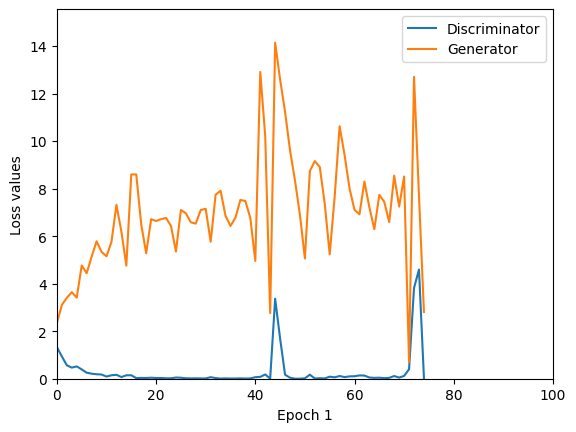

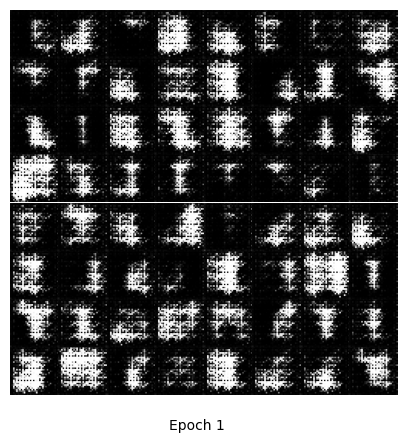

[1/100][0/75]	Loss_D: 0.5658	Loss_G: 4.2122	D(x): 0.9904	D(G(z)): 0.3994 / 0.0196
[1/100][10/75]	Loss_D: 0.2794	Loss_G: 5.8093	D(x): 0.9559	D(G(z)): 0.1936 / 0.0036
[1/100][20/75]	Loss_D: 0.2406	Loss_G: 3.1930	D(x): 0.8862	D(G(z)): 0.0718 / 0.0503
[1/100][30/75]	Loss_D: 0.3912	Loss_G: 4.0769	D(x): 0.7874	D(G(z)): 0.0112 / 0.0256
[1/100][40/75]	Loss_D: 0.0354	Loss_G: 5.1416	D(x): 0.9829	D(G(z)): 0.0171 / 0.0073
[1/100][50/75]	Loss_D: 1.0544	Loss_G: 6.6150	D(x): 0.9854	D(G(z)): 0.5530 / 0.0032
[1/100][60/75]	Loss_D: 0.4272	Loss_G: 3.3749	D(x): 0.8795	D(G(z)): 0.1849 / 0.0494
[1/100][70/75]	Loss_D: 0.3434	Loss_G: 3.5455	D(x): 0.9246	D(G(z)): 0.1798 / 0.0461
[2/100][0/75]	Loss_D: 0.6980	Loss_G: 2.0034	D(x): 0.7413	D(G(z)): 0.1057 / 0.1938
[2/100][10/75]	Loss_D: 0.5235	Loss_G: 2.6056	D(x): 0.7380	D(G(z)): 0.1490 / 0.1043
[2/100][20/75]	Loss_D: 0.8351	Loss_G: 3.8951	D(x): 0.8699	D(G(z)): 0.4337 / 0.0280
[2/100][30/75]	Loss_D: 0.6924	Loss_G: 1.6663	D(x): 0.6641	D(G(z)): 0.0887 / 0.2250
[2/100

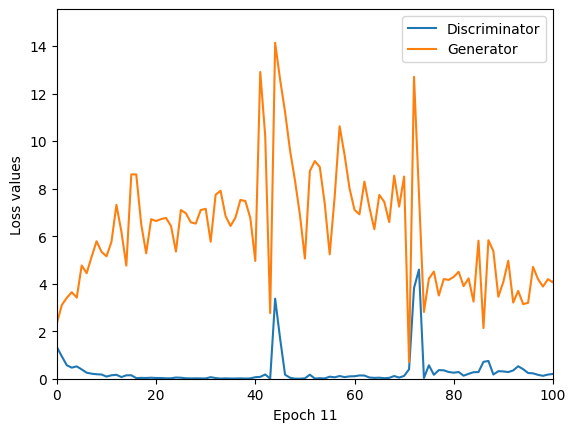

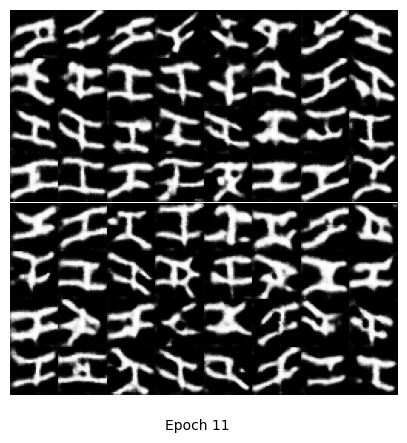

[11/100][0/75]	Loss_D: 0.8745	Loss_G: 0.9462	D(x): 0.5187	D(G(z)): 0.1026 / 0.4299
[11/100][10/75]	Loss_D: 1.0210	Loss_G: 1.0832	D(x): 0.5553	D(G(z)): 0.2294 / 0.4173
[11/100][20/75]	Loss_D: 0.6496	Loss_G: 2.0054	D(x): 0.6543	D(G(z)): 0.1056 / 0.1816
[11/100][30/75]	Loss_D: 0.6846	Loss_G: 0.6209	D(x): 0.5905	D(G(z)): 0.0634 / 0.5903
[11/100][40/75]	Loss_D: 0.3919	Loss_G: 2.2855	D(x): 0.8492	D(G(z)): 0.1746 / 0.1269
[11/100][50/75]	Loss_D: 0.2698	Loss_G: 2.6760	D(x): 0.9105	D(G(z)): 0.1450 / 0.0901
[11/100][60/75]	Loss_D: 0.2059	Loss_G: 3.5224	D(x): 0.9424	D(G(z)): 0.1192 / 0.0426
[11/100][70/75]	Loss_D: 0.3225	Loss_G: 2.0870	D(x): 0.8308	D(G(z)): 0.1030 / 0.1764
[12/100][0/75]	Loss_D: 0.4454	Loss_G: 2.1963	D(x): 0.7713	D(G(z)): 0.1314 / 0.1459
[12/100][10/75]	Loss_D: 0.4673	Loss_G: 4.5591	D(x): 0.9290	D(G(z)): 0.2940 / 0.0132
[12/100][20/75]	Loss_D: 0.7232	Loss_G: 1.8446	D(x): 0.5867	D(G(z)): 0.0308 / 0.2297
[12/100][30/75]	Loss_D: 1.4336	Loss_G: 0.7119	D(x): 0.3319	D(G(z)): 0.0067 / 0

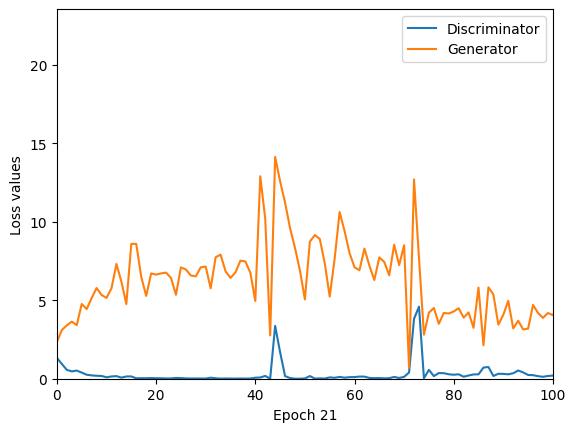

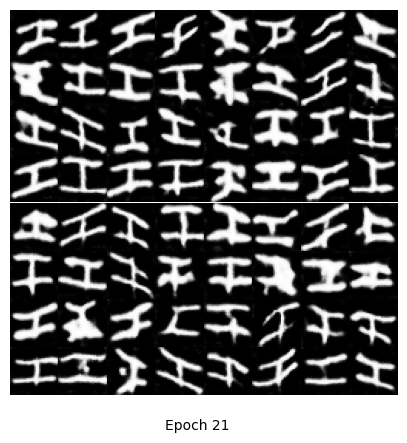

[21/100][0/75]	Loss_D: 0.5674	Loss_G: 2.1890	D(x): 0.6282	D(G(z)): 0.0080 / 0.1820
[21/100][10/75]	Loss_D: 0.6487	Loss_G: 5.3097	D(x): 0.9864	D(G(z)): 0.3967 / 0.0064
[21/100][20/75]	Loss_D: 1.2602	Loss_G: 8.5964	D(x): 0.9955	D(G(z)): 0.6231 / 0.0005
[21/100][30/75]	Loss_D: 0.1825	Loss_G: 3.8062	D(x): 0.9197	D(G(z)): 0.0840 / 0.0296
[21/100][40/75]	Loss_D: 0.0739	Loss_G: 4.1964	D(x): 0.9792	D(G(z)): 0.0496 / 0.0218
[21/100][50/75]	Loss_D: 0.1016	Loss_G: 3.3939	D(x): 0.9366	D(G(z)): 0.0238 / 0.0483
[21/100][60/75]	Loss_D: 0.0826	Loss_G: 3.4161	D(x): 0.9677	D(G(z)): 0.0461 / 0.0493
[21/100][70/75]	Loss_D: 0.0583	Loss_G: 4.3827	D(x): 0.9823	D(G(z)): 0.0387 / 0.0189
[22/100][0/75]	Loss_D: 0.0297	Loss_G: 5.2912	D(x): 0.9887	D(G(z)): 0.0177 / 0.0087
[22/100][10/75]	Loss_D: 0.2926	Loss_G: 3.0393	D(x): 0.8494	D(G(z)): 0.0854 / 0.0684
[22/100][20/75]	Loss_D: 0.3231	Loss_G: 3.7333	D(x): 0.9709	D(G(z)): 0.2298 / 0.0326
[22/100][30/75]	Loss_D: 0.0938	Loss_G: 3.7440	D(x): 0.9642	D(G(z)): 0.0531 / 0

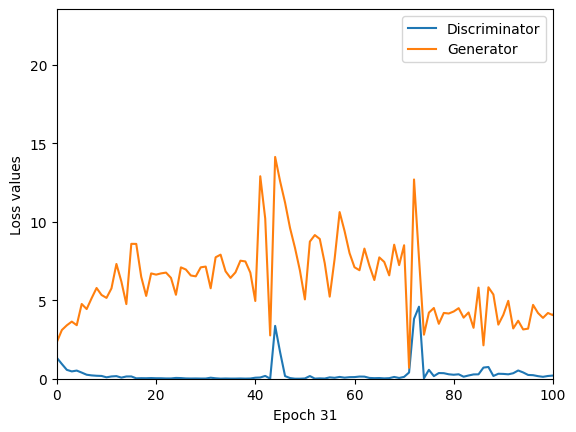

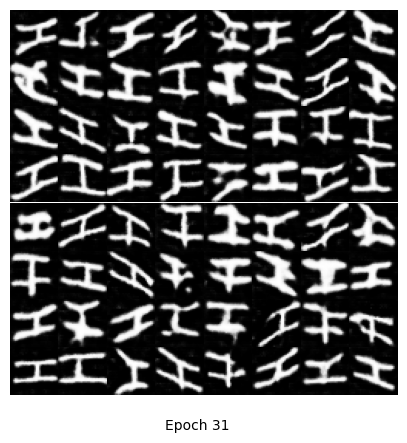

[31/100][0/75]	Loss_D: 0.3397	Loss_G: 3.0585	D(x): 0.8558	D(G(z)): 0.1366 / 0.0643
[31/100][10/75]	Loss_D: 0.0953	Loss_G: 3.7685	D(x): 0.9272	D(G(z)): 0.0148 / 0.0490
[31/100][20/75]	Loss_D: 0.2391	Loss_G: 3.5293	D(x): 0.9172	D(G(z)): 0.1217 / 0.0391
[31/100][30/75]	Loss_D: 0.0931	Loss_G: 4.0668	D(x): 0.9822	D(G(z)): 0.0666 / 0.0322
[31/100][40/75]	Loss_D: 0.0540	Loss_G: 5.1078	D(x): 0.9633	D(G(z)): 0.0147 / 0.0136
[31/100][50/75]	Loss_D: 0.0730	Loss_G: 4.0423	D(x): 0.9651	D(G(z)): 0.0353 / 0.0262
[31/100][60/75]	Loss_D: 0.0496	Loss_G: 4.1767	D(x): 0.9932	D(G(z)): 0.0412 / 0.0203
[31/100][70/75]	Loss_D: 0.0253	Loss_G: 6.1298	D(x): 0.9779	D(G(z)): 0.0025 / 0.0034
[32/100][0/75]	Loss_D: 0.0611	Loss_G: 4.8820	D(x): 0.9970	D(G(z)): 0.0540 / 0.0114
[32/100][10/75]	Loss_D: 0.0219	Loss_G: 5.1093	D(x): 0.9921	D(G(z)): 0.0136 / 0.0104
[32/100][20/75]	Loss_D: 0.0618	Loss_G: 5.3301	D(x): 0.9879	D(G(z)): 0.0471 / 0.0080
[32/100][30/75]	Loss_D: 0.0354	Loss_G: 5.4886	D(x): 0.9910	D(G(z)): 0.0255 / 0

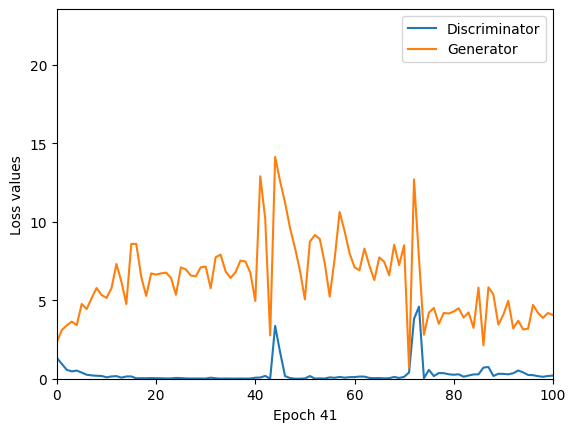

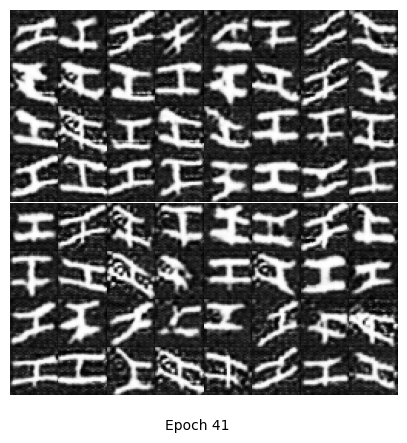

[41/100][0/75]	Loss_D: 0.0035	Loss_G: 8.9292	D(x): 0.9968	D(G(z)): 0.0002 / 0.0003
[41/100][10/75]	Loss_D: 0.0243	Loss_G: 5.3978	D(x): 0.9821	D(G(z)): 0.0057 / 0.0092
[41/100][20/75]	Loss_D: 0.0466	Loss_G: 6.1867	D(x): 0.9966	D(G(z)): 0.0415 / 0.0035
[41/100][30/75]	Loss_D: 0.0185	Loss_G: 5.3251	D(x): 0.9998	D(G(z)): 0.0179 / 0.0073
[41/100][40/75]	Loss_D: 0.9206	Loss_G: 4.2116	D(x): 0.8632	D(G(z)): 0.4118 / 0.0194
[41/100][50/75]	Loss_D: 0.2222	Loss_G: 3.5696	D(x): 0.8861	D(G(z)): 0.0832 / 0.0583
[41/100][60/75]	Loss_D: 0.4949	Loss_G: 4.1807	D(x): 0.9682	D(G(z)): 0.3161 / 0.0201
[41/100][70/75]	Loss_D: 0.2004	Loss_G: 4.4650	D(x): 0.9472	D(G(z)): 0.1164 / 0.0151
[42/100][0/75]	Loss_D: 0.3185	Loss_G: 3.1762	D(x): 0.8545	D(G(z)): 0.1118 / 0.0574
[42/100][10/75]	Loss_D: 0.6791	Loss_G: 5.9701	D(x): 0.9888	D(G(z)): 0.4276 / 0.0037
[42/100][20/75]	Loss_D: 2.2901	Loss_G: 0.1339	D(x): 0.1818	D(G(z)): 0.0061 / 0.8846
[42/100][30/75]	Loss_D: 0.2549	Loss_G: 3.5251	D(x): 0.8933	D(G(z)): 0.1012 / 0

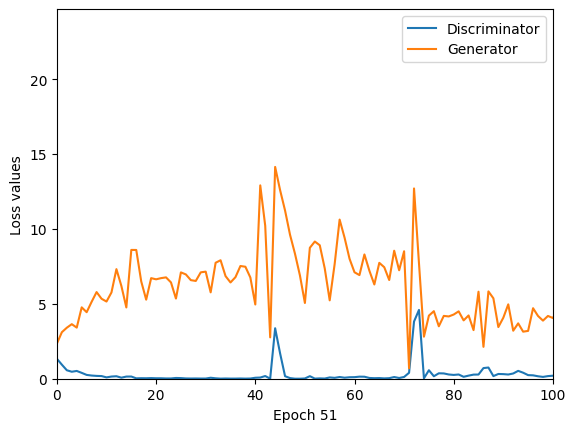

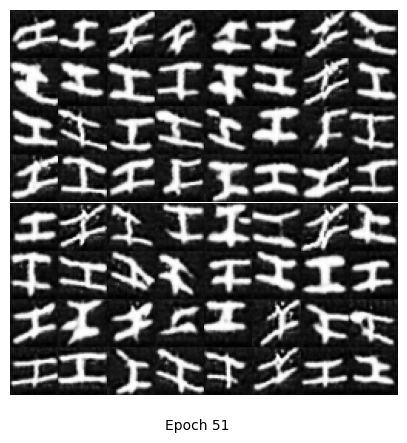

[51/100][0/75]	Loss_D: 0.5792	Loss_G: 2.9677	D(x): 0.7824	D(G(z)): 0.2093 / 0.0876
[51/100][10/75]	Loss_D: 0.4103	Loss_G: 2.0887	D(x): 0.8017	D(G(z)): 0.1043 / 0.1762
[51/100][20/75]	Loss_D: 0.3160	Loss_G: 4.7030	D(x): 0.7722	D(G(z)): 0.0124 / 0.0213
[51/100][30/75]	Loss_D: 0.2939	Loss_G: 3.4201	D(x): 0.8076	D(G(z)): 0.0381 / 0.0579
[51/100][40/75]	Loss_D: 0.3916	Loss_G: 1.8514	D(x): 0.7508	D(G(z)): 0.0529 / 0.2089
[51/100][50/75]	Loss_D: 0.2157	Loss_G: 3.5394	D(x): 0.8988	D(G(z)): 0.0827 / 0.0443
[51/100][60/75]	Loss_D: 0.2050	Loss_G: 4.3531	D(x): 0.8557	D(G(z)): 0.0092 / 0.0278
[51/100][70/75]	Loss_D: 0.1244	Loss_G: 4.0416	D(x): 0.9604	D(G(z)): 0.0700 / 0.0235
[52/100][0/75]	Loss_D: 0.2620	Loss_G: 1.7513	D(x): 0.8218	D(G(z)): 0.0302 / 0.2513
[52/100][10/75]	Loss_D: 0.0556	Loss_G: 4.4542	D(x): 0.9592	D(G(z)): 0.0125 / 0.0188
[52/100][20/75]	Loss_D: 0.1437	Loss_G: 3.4397	D(x): 0.8948	D(G(z)): 0.0233 / 0.0437
[52/100][30/75]	Loss_D: 0.0378	Loss_G: 4.9766	D(x): 0.9837	D(G(z)): 0.0199 / 0

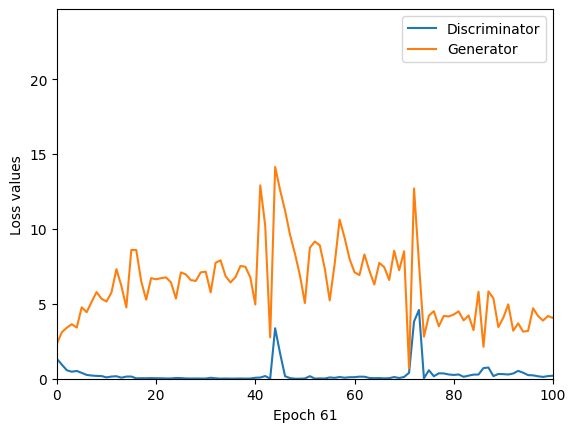

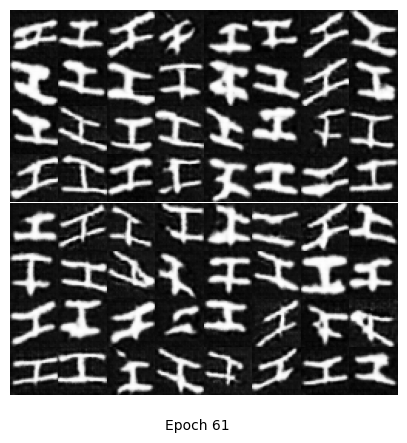

[61/100][0/75]	Loss_D: 0.5723	Loss_G: 3.2231	D(x): 0.9153	D(G(z)): 0.3197 / 0.0588
[61/100][10/75]	Loss_D: 0.1478	Loss_G: 4.2272	D(x): 0.9030	D(G(z)): 0.0382 / 0.0213
[61/100][20/75]	Loss_D: 0.2269	Loss_G: 4.0323	D(x): 0.8773	D(G(z)): 0.0717 / 0.0302
[61/100][30/75]	Loss_D: 0.6943	Loss_G: 6.0288	D(x): 0.9978	D(G(z)): 0.4187 / 0.0036
[61/100][40/75]	Loss_D: 0.1413	Loss_G: 3.7693	D(x): 0.9296	D(G(z)): 0.0565 / 0.0468
[61/100][50/75]	Loss_D: 0.3003	Loss_G: 4.3644	D(x): 0.8066	D(G(z)): 0.0044 / 0.0255
[61/100][60/75]	Loss_D: 0.1159	Loss_G: 4.0943	D(x): 0.9171	D(G(z)): 0.0157 / 0.0259
[61/100][70/75]	Loss_D: 0.0292	Loss_G: 6.0808	D(x): 0.9932	D(G(z)): 0.0218 / 0.0042
[62/100][0/75]	Loss_D: 0.2541	Loss_G: 4.4696	D(x): 0.9779	D(G(z)): 0.1541 / 0.0197
[62/100][10/75]	Loss_D: 0.2835	Loss_G: 2.9743	D(x): 0.8017	D(G(z)): 0.0100 / 0.0998
[62/100][20/75]	Loss_D: 0.1998	Loss_G: 5.1119	D(x): 0.8508	D(G(z)): 0.0131 / 0.0190
[62/100][30/75]	Loss_D: 0.0422	Loss_G: 4.9806	D(x): 0.9945	D(G(z)): 0.0350 / 0

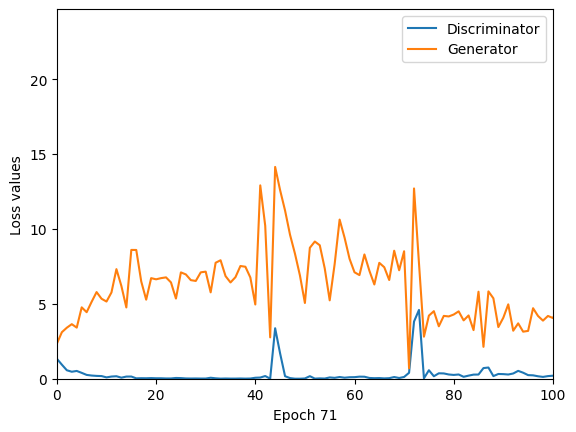

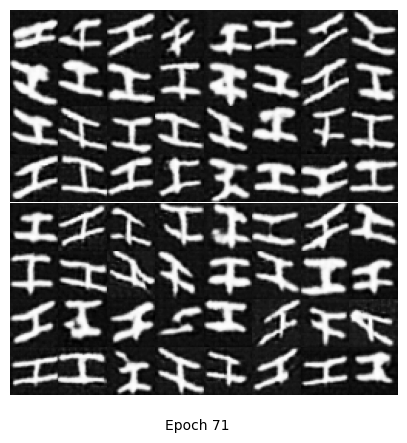

[71/100][0/75]	Loss_D: 0.0961	Loss_G: 3.7449	D(x): 0.9478	D(G(z)): 0.0383 / 0.0458
[71/100][10/75]	Loss_D: 0.3480	Loss_G: 3.8983	D(x): 0.7764	D(G(z)): 0.0179 / 0.0548
[71/100][20/75]	Loss_D: 0.1978	Loss_G: 4.0095	D(x): 0.8749	D(G(z)): 0.0437 / 0.0435
[71/100][30/75]	Loss_D: 0.5633	Loss_G: 7.1986	D(x): 0.9750	D(G(z)): 0.3444 / 0.0015
[71/100][40/75]	Loss_D: 0.4963	Loss_G: 1.7442	D(x): 0.7034	D(G(z)): 0.0343 / 0.2638
[71/100][50/75]	Loss_D: 0.2065	Loss_G: 4.2084	D(x): 0.8600	D(G(z)): 0.0162 / 0.0399
[71/100][60/75]	Loss_D: 0.0492	Loss_G: 4.8311	D(x): 0.9808	D(G(z)): 0.0259 / 0.0130
[71/100][70/75]	Loss_D: 0.0521	Loss_G: 4.9193	D(x): 0.9589	D(G(z)): 0.0085 / 0.0151
[72/100][0/75]	Loss_D: 0.0219	Loss_G: 4.8833	D(x): 0.9920	D(G(z)): 0.0137 / 0.0116
[72/100][10/75]	Loss_D: 0.0820	Loss_G: 5.7253	D(x): 0.9930	D(G(z)): 0.0657 / 0.0050
[72/100][20/75]	Loss_D: 0.0223	Loss_G: 5.9457	D(x): 0.9857	D(G(z)): 0.0077 / 0.0075
[72/100][30/75]	Loss_D: 0.0244	Loss_G: 5.2170	D(x): 0.9920	D(G(z)): 0.0161 / 0

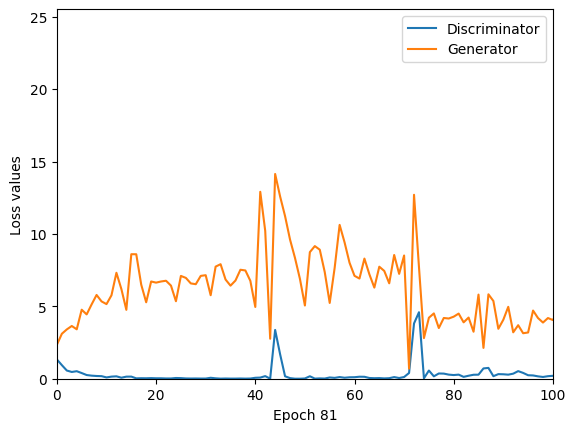

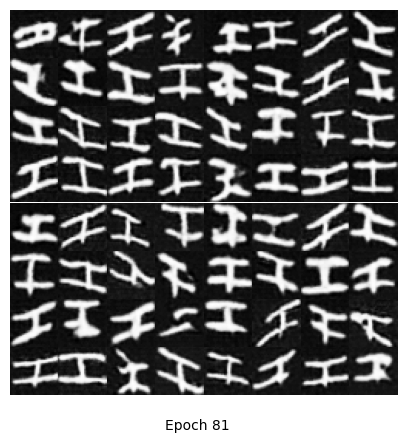

[81/100][0/75]	Loss_D: 0.1955	Loss_G: 4.9633	D(x): 0.8498	D(G(z)): 0.0080 / 0.0149
[81/100][10/75]	Loss_D: 0.1503	Loss_G: 3.8153	D(x): 0.9083	D(G(z)): 0.0406 / 0.0388
[81/100][20/75]	Loss_D: 0.4464	Loss_G: 4.4136	D(x): 0.7080	D(G(z)): 0.0019 / 0.0352
[81/100][30/75]	Loss_D: 0.0345	Loss_G: 5.1844	D(x): 0.9832	D(G(z)): 0.0165 / 0.0114
[81/100][40/75]	Loss_D: 0.0227	Loss_G: 5.3690	D(x): 0.9906	D(G(z)): 0.0131 / 0.0092
[81/100][50/75]	Loss_D: 0.0487	Loss_G: 4.5801	D(x): 0.9934	D(G(z)): 0.0398 / 0.0195
[81/100][60/75]	Loss_D: 0.0229	Loss_G: 5.4479	D(x): 0.9872	D(G(z)): 0.0097 / 0.0080
[81/100][70/75]	Loss_D: 0.0162	Loss_G: 5.4026	D(x): 0.9987	D(G(z)): 0.0146 / 0.0101
[82/100][0/75]	Loss_D: 0.0364	Loss_G: 4.9271	D(x): 0.9948	D(G(z)): 0.0280 / 0.0129
[82/100][10/75]	Loss_D: 0.0173	Loss_G: 5.5506	D(x): 0.9959	D(G(z)): 0.0129 / 0.0076
[82/100][20/75]	Loss_D: 0.0270	Loss_G: 5.6871	D(x): 0.9800	D(G(z)): 0.0058 / 0.0085
[82/100][30/75]	Loss_D: 0.0751	Loss_G: 5.3437	D(x): 0.9977	D(G(z)): 0.0678 / 0

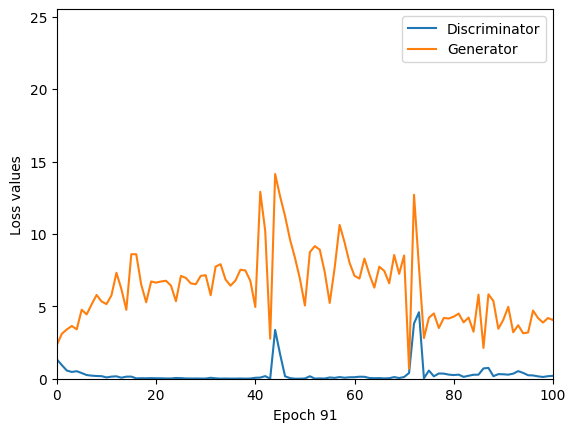

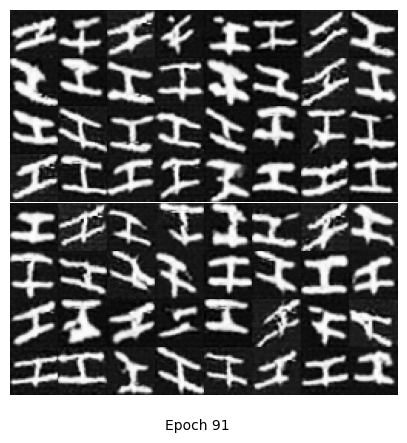

[91/100][0/75]	Loss_D: 0.0061	Loss_G: 6.5424	D(x): 0.9982	D(G(z)): 0.0042 / 0.0033
[91/100][10/75]	Loss_D: 0.0241	Loss_G: 5.5723	D(x): 0.9806	D(G(z)): 0.0040 / 0.0071
[91/100][20/75]	Loss_D: 0.0474	Loss_G: 5.7633	D(x): 0.9604	D(G(z)): 0.0025 / 0.0061
[91/100][30/75]	Loss_D: 0.0281	Loss_G: 6.1399	D(x): 0.9946	D(G(z)): 0.0217 / 0.0056
[91/100][40/75]	Loss_D: 0.0070	Loss_G: 8.2206	D(x): 0.9937	D(G(z)): 0.0006 / 0.0008
[91/100][50/75]	Loss_D: 0.0027	Loss_G: 8.7925	D(x): 0.9976	D(G(z)): 0.0003 / 0.0003
[91/100][60/75]	Loss_D: 0.0371	Loss_G: 6.1809	D(x): 0.9994	D(G(z)): 0.0340 / 0.0037
[91/100][70/75]	Loss_D: 0.0124	Loss_G: 7.0328	D(x): 0.9893	D(G(z)): 0.0016 / 0.0021
[92/100][0/75]	Loss_D: 0.0138	Loss_G: 6.2837	D(x): 0.9966	D(G(z)): 0.0102 / 0.0053
[92/100][10/75]	Loss_D: 0.0053	Loss_G: 6.9233	D(x): 0.9969	D(G(z)): 0.0022 / 0.0020
[92/100][20/75]	Loss_D: 0.0095	Loss_G: 6.0877	D(x): 0.9966	D(G(z)): 0.0060 / 0.0045
[92/100][30/75]	Loss_D: 0.0042	Loss_G: 6.9306	D(x): 0.9986	D(G(z)): 0.0028 / 0

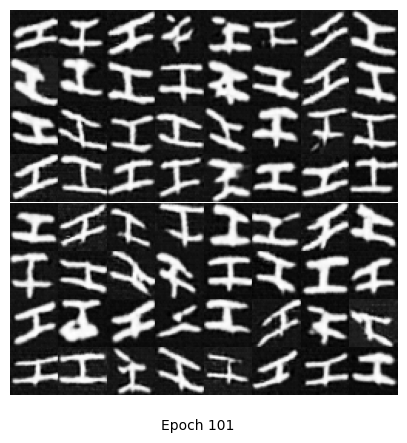

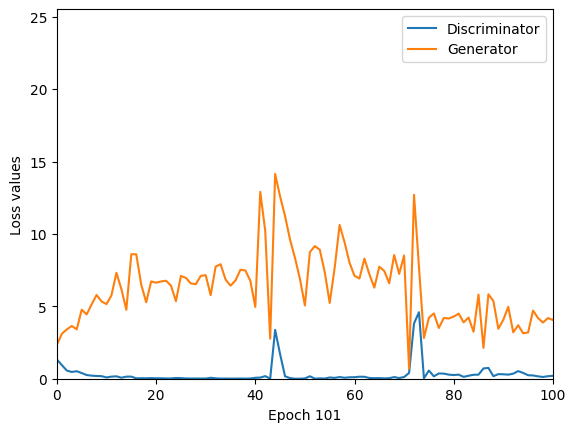

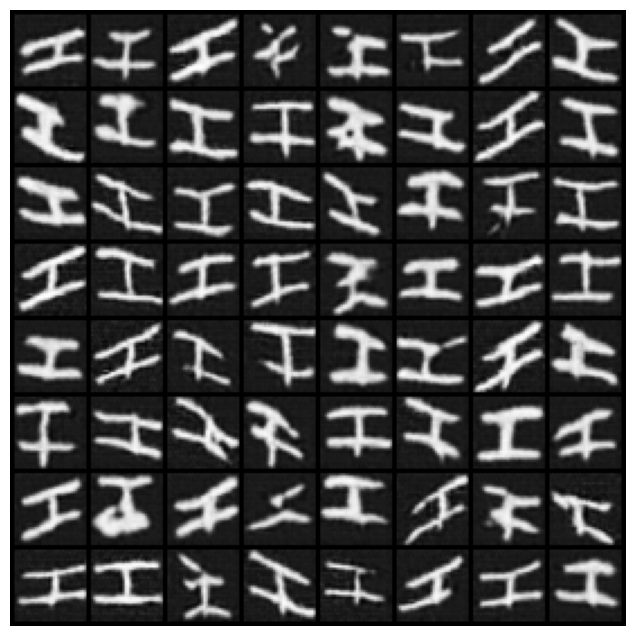

In [ ]:
netG = Generator(params).to(device)
# The weights_init() function is called to randomly initialize all weights to mean=0.0, stddev=0.2
netG.apply(weights_init)
# Print the model to check the structure
print(netG)

netD = Discriminator(params).to(device)
# Apply the weights_init() function to randomly initialize all
# weights to mean=0.0, stddev=0.2
netD.apply(weights_init)
# Print the model.
print(netD)

# For defining the loss function to use: Binary Cross Entropy loss function.
criterion = nn.BCELoss().to(device)

#Define a fixed noise map to ensure the reproducibility of your results
fixed_noise = torch.randn(64, params['nz'], 1, 1, device=device)

real_label = 1
fake_label = 0

# Optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))

# Stores generated images as training progresses.
img_list = []
# To Store G's and D's losses during training.
G_losses = []
D_losses = []

iters = 0

print("Now Training...")
print("-"*25)

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        # TODO!!! Part 3: Complete code from here to finish the training/generation process of DCGAN
        netD.zero_grad()
        # Transfer data tensor to GPU/CPU (device)
        real_data = data[0].to(device)
        # Get batch size. Can be different from params['nbsize'] for last batch in epoch.
        b_size = real_data.size(0)

        # TODO!!! training (a): train D using real data
        # Here, D_x = output.mean().item() can be used to denote the corresponding term of this part
        # errD_real is the loss generated here
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_data).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # TODO!!! training (b): train D using fake data
        #  -- fake data needs to go through the current G.
        # Here, D_G_z1 = output.mean().item() can be used to denote the corresponding term of this part
        # Sample random data from a unit normal distribution.
        # errD_fake is the loss generated here
        noise = torch.randn(b_size, params['nz'], 1, 1, device=device)

        fake = netG(noise)
        label.fill_(fake_label)

        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)

        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Net discriminator loss.
        errD = errD_real + errD_fake
        # Update discriminator parameters.
        optimizerD.step()

        # TODO!!! training (c): train G by backpropagation
        # Here, D_G_z2 = output.mean().item() can be used to represent the corresponding loss term.
        # errG is the overall loss for G
        netG.zero_grad()
        label.fill_(real_label)

        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update generator parameters.
        optimizerG.step()

        # Check progress of training.
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, params['nepochs'], i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save the losses for plotting.
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        iters += 1

    # Save the model.
    if epoch % params['save_epoch'] == 0:
        #TODO!!! Save the model (Part 3.2)
        torch.save(netG.state_dict(), "/content/drive/MyDrive/AIML431/project4/model/" + str(epoch) + '_netG.pth')
        plot_loss(D_losses, G_losses, epoch, save=False, show=True)

    # Show result for fixed noise
    if epoch % 10 == 0:
        #TODO!!! Finish the code in "plot_result()" and call it properly to generate and save images
        plot_result(netG, fixed_noise, epoch, save=False, fig_size=(5, 5))

    # Check how the generator is doing by saving G's output on fixed_noise
    if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True))



# TODO!!! Save the final trained model.
torch.save(netG.state_dict(), '/content/drive/MyDrive/AIML431/project4/model/final_netG.pth')

# plot Images with final model

# PATH = '/content/drive/MyDrive/AIML431/project4/model/final_netG.pth'
# netG.load_state_dict(torch.load(PATH))
# netG.to(device)
# netG.eval()
plot_result(netG, fixed_noise, num_epochs, save=False, fig_size=(5, 5))

# Plot the training losses.
plot_loss(D_losses, G_losses, num_epochs, save=False, save_dir='/content/drive/MyDrive/AIML431/project4/model/DCGAN_results/', show=True)


# Animation showing the improvements of the generator.
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

#TODO!!! Part 4 (Challenge) Make necessary changes to adapt to Conditional DCGAN model.
#Any reasonable attempts you made could get some points, even the new model doesn't work properly.


ConditionalGenerator(
  (hidden_layer1): Sequential(
    (0): ConvTranspose2d(100, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (hidden_layer2): Sequential(
    (0): ConvTranspose2d(2, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (hidden_layer): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
   

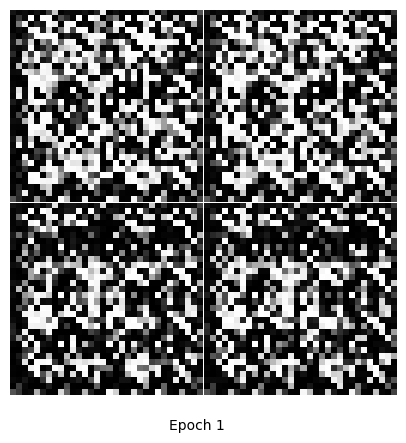

[1/100][0/150]	Loss_D: 0.0179	Loss_G: 4.9791	D(x): 0.9923	D(G(z)): 0.0100 / 0.0070
[1/100][10/150]	Loss_D: 0.0189	Loss_G: 5.0248	D(x): 0.9924	D(G(z)): 0.0111 / 0.0069
[1/100][20/150]	Loss_D: 0.0217	Loss_G: 4.8713	D(x): 0.9920	D(G(z)): 0.0134 / 0.0078
[1/100][30/150]	Loss_D: 0.0179	Loss_G: 5.1682	D(x): 0.9911	D(G(z)): 0.0088 / 0.0058
[1/100][40/150]	Loss_D: 0.0099	Loss_G: 5.3280	D(x): 0.9971	D(G(z)): 0.0070 / 0.0049
[1/100][50/150]	Loss_D: 0.0119	Loss_G: 5.3651	D(x): 0.9948	D(G(z)): 0.0066 / 0.0048
[1/100][60/150]	Loss_D: 0.0130	Loss_G: 5.2351	D(x): 0.9949	D(G(z)): 0.0078 / 0.0055
[1/100][70/150]	Loss_D: 0.0081	Loss_G: 5.5034	D(x): 0.9975	D(G(z)): 0.0056 / 0.0042
[1/100][80/150]	Loss_D: 0.0089	Loss_G: 5.5841	D(x): 0.9960	D(G(z)): 0.0049 / 0.0039
[1/100][90/150]	Loss_D: 0.0195	Loss_G: 5.3122	D(x): 0.9892	D(G(z)): 0.0075 / 0.0052
[1/100][100/150]	Loss_D: 0.0126	Loss_G: 5.5213	D(x): 0.9935	D(G(z)): 0.0059 / 0.0041
[1/100][110/150]	Loss_D: 0.0119	Loss_G: 5.4724	D(x): 0.9944	D(G(z)): 0.0062 

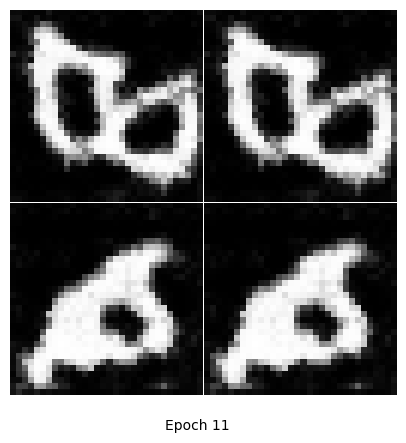

[11/100][0/150]	Loss_D: 0.0376	Loss_G: 5.8014	D(x): 0.9807	D(G(z)): 0.0137 / 0.0072
[11/100][10/150]	Loss_D: 0.0513	Loss_G: 5.0287	D(x): 0.9834	D(G(z)): 0.0333 / 0.0067
[11/100][20/150]	Loss_D: 0.0747	Loss_G: 4.9924	D(x): 0.9756	D(G(z)): 0.0433 / 0.0070
[11/100][30/150]	Loss_D: 0.1045	Loss_G: 3.6750	D(x): 0.9441	D(G(z)): 0.0107 / 0.0270
[11/100][40/150]	Loss_D: 0.0325	Loss_G: 5.4490	D(x): 0.9981	D(G(z)): 0.0300 / 0.0043
[11/100][50/150]	Loss_D: 0.1234	Loss_G: 6.1528	D(x): 0.9659	D(G(z)): 0.0789 / 0.0025
[11/100][60/150]	Loss_D: 0.0520	Loss_G: 4.5740	D(x): 0.9718	D(G(z)): 0.0139 / 0.0105
[11/100][70/150]	Loss_D: 0.0249	Loss_G: 5.7856	D(x): 0.9958	D(G(z)): 0.0203 / 0.0033
[11/100][80/150]	Loss_D: 0.3392	Loss_G: 6.4376	D(x): 0.7823	D(G(z)): 0.0007 / 0.0141
[11/100][90/150]	Loss_D: 0.0651	Loss_G: 5.5415	D(x): 0.9818	D(G(z)): 0.0443 / 0.0042
[11/100][100/150]	Loss_D: 0.0750	Loss_G: 5.2089	D(x): 0.9714	D(G(z)): 0.0430 / 0.0055
[11/100][110/150]	Loss_D: 0.0602	Loss_G: 4.4008	D(x): 0.9725	D(G(

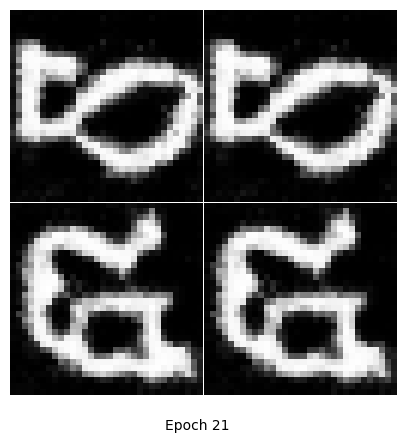

[21/100][0/150]	Loss_D: 0.0296	Loss_G: 5.1345	D(x): 0.9882	D(G(z)): 0.0173 / 0.0060
[21/100][10/150]	Loss_D: 0.0192	Loss_G: 5.8767	D(x): 0.9979	D(G(z)): 0.0169 / 0.0029
[21/100][20/150]	Loss_D: 0.0530	Loss_G: 4.9569	D(x): 0.9759	D(G(z)): 0.0177 / 0.0071
[21/100][30/150]	Loss_D: 0.0148	Loss_G: 5.3165	D(x): 0.9939	D(G(z)): 0.0085 / 0.0050
[21/100][40/150]	Loss_D: 0.0274	Loss_G: 5.3104	D(x): 0.9847	D(G(z)): 0.0112 / 0.0050
[21/100][50/150]	Loss_D: 0.0358	Loss_G: 5.4381	D(x): 0.9813	D(G(z)): 0.0155 / 0.0044
[21/100][60/150]	Loss_D: 0.0550	Loss_G: 5.0843	D(x): 0.9705	D(G(z)): 0.0092 / 0.0063
[21/100][70/150]	Loss_D: 0.0389	Loss_G: 5.0185	D(x): 0.9764	D(G(z)): 0.0132 / 0.0067
[21/100][80/150]	Loss_D: 0.0344	Loss_G: 5.9039	D(x): 0.9975	D(G(z)): 0.0312 / 0.0028
[21/100][90/150]	Loss_D: 0.0516	Loss_G: 4.7093	D(x): 0.9666	D(G(z)): 0.0130 / 0.0091
[21/100][100/150]	Loss_D: 0.0936	Loss_G: 4.5646	D(x): 0.9466	D(G(z)): 0.0120 / 0.0110
[21/100][110/150]	Loss_D: 0.0387	Loss_G: 5.3452	D(x): 0.9841	D(G(

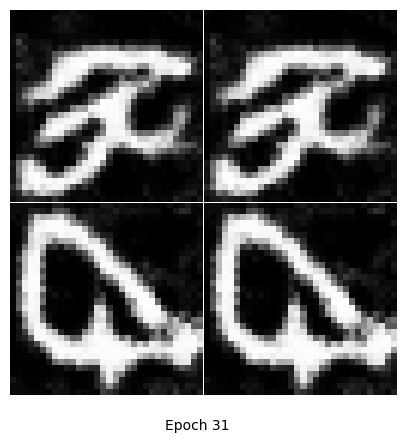

[31/100][0/150]	Loss_D: 0.0441	Loss_G: 5.3187	D(x): 0.9811	D(G(z)): 0.0182 / 0.0058
[31/100][10/150]	Loss_D: 0.0469	Loss_G: 5.0646	D(x): 0.9683	D(G(z)): 0.0110 / 0.0064
[31/100][20/150]	Loss_D: 0.0317	Loss_G: 5.3422	D(x): 0.9798	D(G(z)): 0.0077 / 0.0051
[31/100][30/150]	Loss_D: 0.0729	Loss_G: 4.6556	D(x): 0.9607	D(G(z)): 0.0281 / 0.0109
[31/100][40/150]	Loss_D: 0.0239	Loss_G: 5.3216	D(x): 0.9859	D(G(z)): 0.0072 / 0.0051
[31/100][50/150]	Loss_D: 0.0142	Loss_G: 5.6514	D(x): 0.9904	D(G(z)): 0.0044 / 0.0036
[31/100][60/150]	Loss_D: 0.3062	Loss_G: 10.9318	D(x): 0.7941	D(G(z)): 0.0000 / 0.0002
[31/100][70/150]	Loss_D: 0.0387	Loss_G: 5.8708	D(x): 0.9965	D(G(z)): 0.0344 / 0.0029
[31/100][80/150]	Loss_D: 0.1301	Loss_G: 6.8220	D(x): 0.9121	D(G(z)): 0.0008 / 0.0016
[31/100][90/150]	Loss_D: 0.0528	Loss_G: 4.2415	D(x): 0.9703	D(G(z)): 0.0189 / 0.0145
[31/100][100/150]	Loss_D: 0.0335	Loss_G: 4.9996	D(x): 0.9846	D(G(z)): 0.0145 / 0.0069
[31/100][110/150]	Loss_D: 0.0110	Loss_G: 8.1168	D(x): 0.9914	D(G

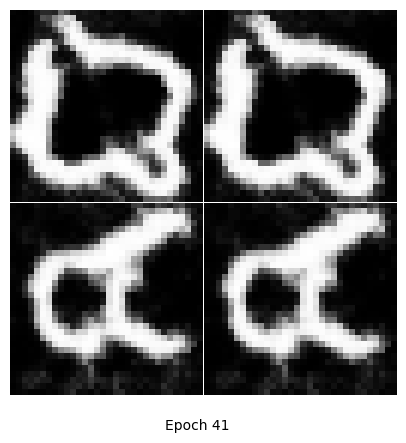

[41/100][0/150]	Loss_D: 0.0156	Loss_G: 6.7117	D(x): 0.9917	D(G(z)): 0.0070 / 0.0012
[41/100][10/150]	Loss_D: 0.0199	Loss_G: 5.9853	D(x): 0.9992	D(G(z)): 0.0189 / 0.0026
[41/100][20/150]	Loss_D: 0.0376	Loss_G: 5.6404	D(x): 0.9988	D(G(z)): 0.0358 / 0.0036
[41/100][30/150]	Loss_D: 0.0114	Loss_G: 6.1413	D(x): 0.9955	D(G(z)): 0.0068 / 0.0022
[41/100][40/150]	Loss_D: 0.0267	Loss_G: 4.8773	D(x): 0.9833	D(G(z)): 0.0077 / 0.0077
[41/100][50/150]	Loss_D: 0.0879	Loss_G: 3.2918	D(x): 0.9485	D(G(z)): 0.0087 / 0.0384
[41/100][60/150]	Loss_D: 0.0111	Loss_G: 5.9845	D(x): 0.9959	D(G(z)): 0.0068 / 0.0025
[41/100][70/150]	Loss_D: 0.0086	Loss_G: 5.8465	D(x): 0.9976	D(G(z)): 0.0062 / 0.0032
[41/100][80/150]	Loss_D: 0.0099	Loss_G: 6.2176	D(x): 0.9938	D(G(z)): 0.0035 / 0.0020
[41/100][90/150]	Loss_D: 0.0134	Loss_G: 5.8968	D(x): 0.9943	D(G(z)): 0.0074 / 0.0029
[41/100][100/150]	Loss_D: 0.0132	Loss_G: 5.6586	D(x): 0.9966	D(G(z)): 0.0097 / 0.0036
[41/100][110/150]	Loss_D: 0.0147	Loss_G: 5.6038	D(x): 0.9995	D(G(

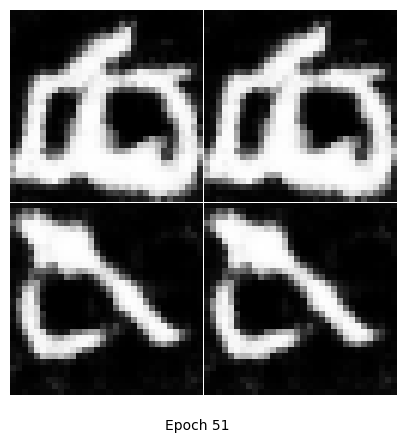

[51/100][0/150]	Loss_D: 0.0374	Loss_G: 5.8053	D(x): 0.9951	D(G(z)): 0.0318 / 0.0031
[51/100][10/150]	Loss_D: 0.0233	Loss_G: 5.8314	D(x): 0.9957	D(G(z)): 0.0187 / 0.0048
[51/100][20/150]	Loss_D: 0.0178	Loss_G: 5.4797	D(x): 0.9927	D(G(z)): 0.0101 / 0.0043
[51/100][30/150]	Loss_D: 0.0075	Loss_G: 8.3987	D(x): 0.9940	D(G(z)): 0.0011 / 0.0015
[51/100][40/150]	Loss_D: 0.0214	Loss_G: 5.4208	D(x): 0.9888	D(G(z)): 0.0094 / 0.0045
[51/100][50/150]	Loss_D: 0.0069	Loss_G: 6.4081	D(x): 0.9964	D(G(z)): 0.0032 / 0.0019
[51/100][60/150]	Loss_D: 0.2878	Loss_G: 8.9135	D(x): 0.8958	D(G(z)): 0.0000 / 0.0001
[51/100][70/150]	Loss_D: 0.0103	Loss_G: 7.7674	D(x): 0.9968	D(G(z)): 0.0070 / 0.0033
[51/100][80/150]	Loss_D: 0.1088	Loss_G: 7.1942	D(x): 0.9353	D(G(z)): 0.0019 / 0.0057
[51/100][90/150]	Loss_D: 0.0842	Loss_G: 4.0811	D(x): 0.9644	D(G(z)): 0.0107 / 0.0173
[51/100][100/150]	Loss_D: 0.0869	Loss_G: 4.1713	D(x): 0.9685	D(G(z)): 0.0205 / 0.0172
[51/100][110/150]	Loss_D: 0.0464	Loss_G: 4.6869	D(x): 0.9751	D(G(

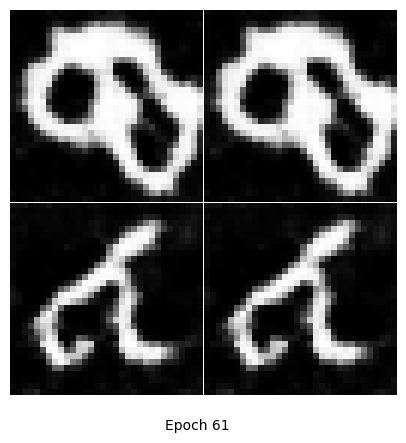

[61/100][0/150]	Loss_D: 0.0473	Loss_G: 5.3547	D(x): 0.9689	D(G(z)): 0.0085 / 0.0048
[61/100][10/150]	Loss_D: 0.0626	Loss_G: 5.4161	D(x): 0.9707	D(G(z)): 0.0211 / 0.0046
[61/100][20/150]	Loss_D: 0.0177	Loss_G: 9.2383	D(x): 0.9843	D(G(z)): 0.0008 / 0.0011
[61/100][30/150]	Loss_D: 0.0602	Loss_G: 5.8356	D(x): 0.9798	D(G(z)): 0.0310 / 0.0030
[61/100][40/150]	Loss_D: 0.0063	Loss_G: 7.2618	D(x): 0.9983	D(G(z)): 0.0045 / 0.0008
[61/100][50/150]	Loss_D: 0.1021	Loss_G: 4.2022	D(x): 0.9558	D(G(z)): 0.0103 / 0.0154
[61/100][60/150]	Loss_D: 0.0130	Loss_G: 5.3958	D(x): 0.9936	D(G(z)): 0.0063 / 0.0049
[61/100][70/150]	Loss_D: 0.0585	Loss_G: 4.5718	D(x): 0.9799	D(G(z)): 0.0270 / 0.0105
[61/100][80/150]	Loss_D: 0.0913	Loss_G: 4.0154	D(x): 0.9577	D(G(z)): 0.0110 / 0.0184
[61/100][90/150]	Loss_D: 0.0507	Loss_G: 5.8217	D(x): 0.9908	D(G(z)): 0.0393 / 0.0031
[61/100][100/150]	Loss_D: 0.0304	Loss_G: 5.0113	D(x): 0.9873	D(G(z)): 0.0165 / 0.0069
[61/100][110/150]	Loss_D: 0.0427	Loss_G: 5.2004	D(x): 0.9776	D(G(

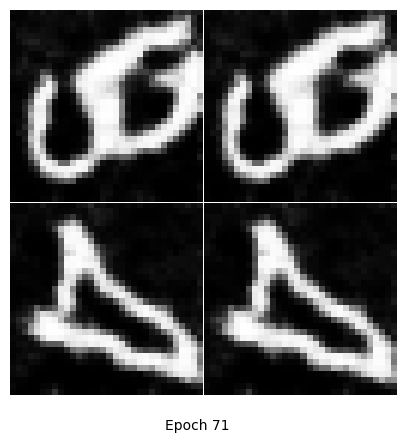

[71/100][0/150]	Loss_D: 0.0798	Loss_G: 4.0856	D(x): 0.9474	D(G(z)): 0.0101 / 0.0170
[71/100][10/150]	Loss_D: 0.0202	Loss_G: 5.9849	D(x): 0.9941	D(G(z)): 0.0138 / 0.0026
[71/100][20/150]	Loss_D: 0.0356	Loss_G: 5.0919	D(x): 0.9988	D(G(z)): 0.0338 / 0.0062
[71/100][30/150]	Loss_D: 0.0276	Loss_G: 5.1468	D(x): 0.9846	D(G(z)): 0.0100 / 0.0060
[71/100][40/150]	Loss_D: 0.0193	Loss_G: 5.6026	D(x): 0.9909	D(G(z)): 0.0096 / 0.0037
[71/100][50/150]	Loss_D: 0.0943	Loss_G: 3.8956	D(x): 0.9385	D(G(z)): 0.0112 / 0.0209
[71/100][60/150]	Loss_D: 0.1370	Loss_G: 5.0985	D(x): 0.9672	D(G(z)): 0.0130 / 0.0065
[71/100][70/150]	Loss_D: 0.0111	Loss_G: 5.4566	D(x): 0.9969	D(G(z)): 0.0079 / 0.0043
[71/100][80/150]	Loss_D: 0.0663	Loss_G: 7.3734	D(x): 0.9997	D(G(z)): 0.0638 / 0.0007
[71/100][90/150]	Loss_D: 0.0323	Loss_G: 16.2019	D(x): 0.9707	D(G(z)): 0.0000 / 0.0000
[71/100][100/150]	Loss_D: 0.1045	Loss_G: 8.3536	D(x): 0.9571	D(G(z)): 0.0010 / 0.0002
[71/100][110/150]	Loss_D: 0.0628	Loss_G: 7.2142	D(x): 0.9630	D(G

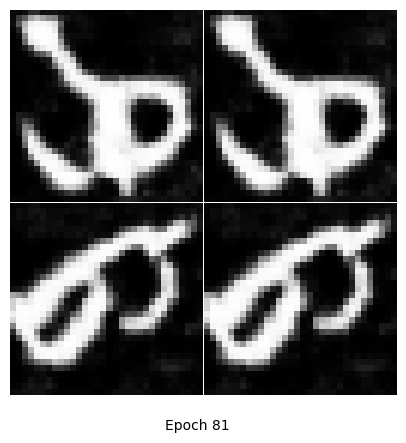

[81/100][0/150]	Loss_D: 0.0068	Loss_G: 6.0266	D(x): 0.9970	D(G(z)): 0.0037 / 0.0024
[81/100][10/150]	Loss_D: 0.0263	Loss_G: 5.9717	D(x): 0.9855	D(G(z)): 0.0101 / 0.0030
[81/100][20/150]	Loss_D: 0.0148	Loss_G: 4.9097	D(x): 0.9941	D(G(z)): 0.0084 / 0.0078
[81/100][30/150]	Loss_D: 0.0130	Loss_G: 5.7695	D(x): 0.9942	D(G(z)): 0.0068 / 0.0032
[81/100][40/150]	Loss_D: 0.0105	Loss_G: 5.6210	D(x): 0.9970	D(G(z)): 0.0075 / 0.0038
[81/100][50/150]	Loss_D: 0.0590	Loss_G: 6.0239	D(x): 0.9832	D(G(z)): 0.0348 / 0.0026
[81/100][60/150]	Loss_D: 0.0206	Loss_G: 6.5514	D(x): 0.9995	D(G(z)): 0.0198 / 0.0015
[81/100][70/150]	Loss_D: 0.0212	Loss_G: 5.7950	D(x): 0.9993	D(G(z)): 0.0202 / 0.0034
[81/100][80/150]	Loss_D: 0.1686	Loss_G: 4.0244	D(x): 0.9437	D(G(z)): 0.0119 / 0.0184
[81/100][90/150]	Loss_D: 0.0971	Loss_G: 8.7843	D(x): 0.9935	D(G(z)): 0.0857 / 0.0003
[81/100][100/150]	Loss_D: 0.0583	Loss_G: 5.8685	D(x): 0.9875	D(G(z)): 0.0441 / 0.0032
[81/100][110/150]	Loss_D: 0.0111	Loss_G: 8.0882	D(x): 0.9936	D(G(

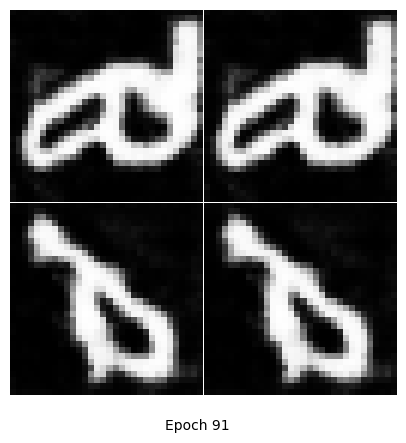

[91/100][0/150]	Loss_D: 0.0211	Loss_G: 5.4996	D(x): 0.9865	D(G(z)): 0.0062 / 0.0044
[91/100][10/150]	Loss_D: 0.0360	Loss_G: 5.4341	D(x): 0.9966	D(G(z)): 0.0317 / 0.0044
[91/100][20/150]	Loss_D: 0.0050	Loss_G: 6.3317	D(x): 0.9991	D(G(z)): 0.0042 / 0.0018
[91/100][30/150]	Loss_D: 0.0332	Loss_G: 4.8598	D(x): 0.9789	D(G(z)): 0.0096 / 0.0080
[91/100][40/150]	Loss_D: 0.0071	Loss_G: 7.0119	D(x): 0.9961	D(G(z)): 0.0030 / 0.0014
[91/100][50/150]	Loss_D: 0.0152	Loss_G: 5.9779	D(x): 0.9981	D(G(z)): 0.0132 / 0.0034
[91/100][60/150]	Loss_D: 0.0345	Loss_G: 5.1596	D(x): 0.9830	D(G(z)): 0.0117 / 0.0058
[91/100][70/150]	Loss_D: 0.0690	Loss_G: 10.5079	D(x): 0.9969	D(G(z)): 0.0598 / 0.0000
[91/100][80/150]	Loss_D: 0.0735	Loss_G: 5.1430	D(x): 0.9566	D(G(z)): 0.0042 / 0.0063
[91/100][90/150]	Loss_D: 0.0392	Loss_G: 4.9932	D(x): 0.9810	D(G(z)): 0.0170 / 0.0070
[91/100][100/150]	Loss_D: 0.0471	Loss_G: 6.3201	D(x): 0.9922	D(G(z)): 0.0381 / 0.0018
[91/100][110/150]	Loss_D: 0.1346	Loss_G: 7.0191	D(x): 0.9200	D(G

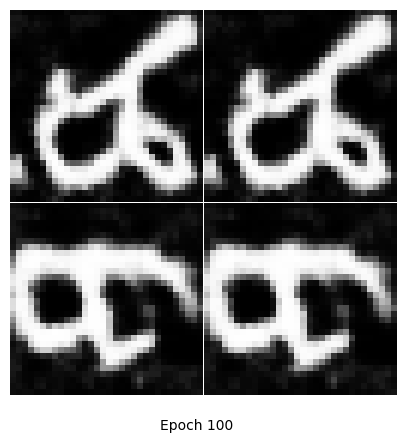

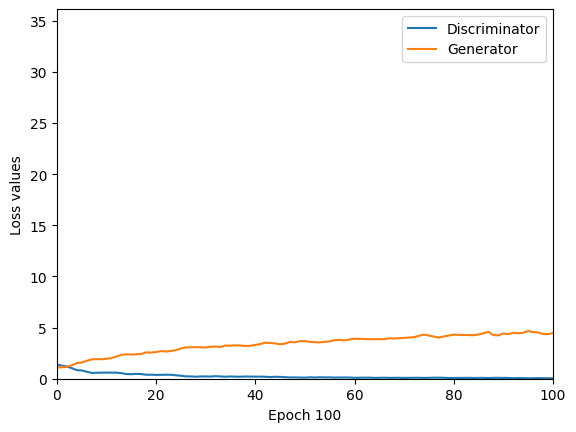

In [ ]:
from torch.autograd import Variable

def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)

def plot_result(generator, noise, label, num_epoch, save=False, save_dir='DCGAN_results/', show=True, fig_size=(5, 5)):
    #TODO!!! Call the model G (generator) properly to generate images from noises (Part 3.3)

    generator.eval()

    gen_image = generator(noise, label)
    gen_image = denorm(gen_image)
    #Important! If you are calling this plot result function during training,
    # don't forget to change the model mode from eval() to train().
    generator.train()
    n_rows = np.sqrt(noise.size()[0]).astype(np.int32)
    n_cols = np.sqrt(noise.size()[0]).astype(np.int32)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=fig_size)
    for ax, img in zip(axes.flatten(), gen_image):
        ax.axis('off')
        ax.adjustable = 'box-forced'
        img = (((img - img.min()) * 255) / (img.max() - img.min())).cpu().data.numpy().transpose(1, 2, 0).astype(np.uint8)
        ax.imshow(img.astype(np.uint8), cmap='Greys_r') # The default grey scale visualization is reversed. Using "_r" to show the correct scale
    plt.subplots_adjust(wspace=0, hspace=0)
    title = 'Epoch {0}'.format(num_epoch+1)
    fig.text(0.5, 0.04, title, ha='center')

    # save figure
    if save:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_fn = save_dir + 'DCGAN_epoch_{:d}'.format(num_epoch+1) + '.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

class ConditionalGenerator(nn.Module):
    def __init__(self, params):
        super().__init__()

        self.hidden_layer1 = torch.nn.Sequential(
            nn.ConvTranspose2d(params['nz'], params['ngf'] * 2, 4, 1, 0, bias=False),
            nn.BatchNorm2d(params['ngf'] * 2),
            nn.ReLU(),
        )
        self.hidden_layer2 = torch.nn.Sequential(
            nn.ConvTranspose2d(params['label_dim'], params['ngf'] * 2, 4, 1, 0, bias=False),
            nn.BatchNorm2d(params['ngf'] * 2),
            nn.ReLU(),
        )
        self.hidden_layer = torch.nn.Sequential(
            nn.ConvTranspose2d(params['ngf'] * 4, params['ngf'] * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ngf'] * 2),
            nn.ReLU(),

            nn.ConvTranspose2d(params['ngf'] * 2, params['ngf'], 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ngf']),
            nn.ReLU(),

            nn.ConvTranspose2d(params['ngf'], 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z, c):
        h1 = self.hidden_layer1(z)
        h2 = self.hidden_layer2(c)
        x = torch.cat([h1, h2], 1)
        x = self.hidden_layer(x)
        return x

class ConditionalDiscriminator(nn.Module):
    def __init__(self, params):
        super().__init__()

        self.hidden_layer1 = torch.nn.Sequential(
            nn.Conv2d(params['nc'], int(params['ndf'] / 2), 4, 2, 1, bias=False),
            # nn.BatchNorm2d(params['ndf']),
            nn.ReLU()
        )
        self.hidden_layer2 = torch.nn.Sequential(
            nn.Conv2d(params['label_dim'], int(params['ndf'] / 2), 4, 2, 1, bias=False),
            # nn.BatchNorm2d(params['ndf']),
            nn.ReLU(),
        )
        self.hidden_layer = torch.nn.Sequential(
            nn.Conv2d(params['ndf'], params['ndf'] * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ndf'] * 2),
            nn.ReLU(),

            nn.Conv2d(params['ndf'] * 2, params['ndf'] * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(params['ndf'] * 4),
            nn.ReLU(),

            nn.Conv2d(params['ndf'] * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )


    def forward(self, z, c):
        h1 = self.hidden_layer1(z)
        h2 = self.hidden_layer2(c)
        x = torch.cat([h1, h2], 1)
        x = self.hidden_layer(x)
        return x

netCG = ConditionalGenerator(params).to(device)
# The weights_init() function is called to randomly initialize all weights to mean=0.0, stddev=0.2
netCG.apply(weights_init)
# Print the model to check the structure
print(netCG)

netCD = ConditionalDiscriminator(params).to(device)
# Apply the weights_init() function to randomly initialize all
# weights to mean=0.0, stddev=0.2
netCD.apply(weights_init)
# Print the model.
print(netCD)

# For defining the loss function to use: Binary Cross Entropy loss function.
criterion = nn.BCELoss().to(device)

#Define a fixed noise map to ensure the reproducibility of your results
temp_noise = torch.randn(params['label_dim'], params['nz'], device=device)
fixed_noise = temp_noise
fixed_c = torch.zeros(params['label_dim'], 1)

fixed_noise = torch.cat([fixed_noise, temp_noise], 0)
temp = torch.ones(params['label_dim'], 1)
fixed_c = torch.cat([fixed_c, temp], 0)

fixed_noise = fixed_noise.view(-1, params['nz'], 1, 1)
fixed_label = torch.zeros(params['label_dim'] * 2, params['label_dim'])
fixed_label.scatter_(1, fixed_c.type(torch.LongTensor), 1)
fixed_label = fixed_label.view(-1, params['label_dim'], 1, 1)
fixed_label = Variable(fixed_label.cuda() if(torch.cuda.is_available()) else fixed_label)

# label preprocess
onehot = torch.zeros(params['label_dim'], params['label_dim'])
onehot = onehot.scatter_(1, torch.LongTensor([0, 1]).view(params['label_dim'], 1), 1).view(params['label_dim'], params['label_dim'], 1, 1)
fill = torch.zeros([params['label_dim'], params['label_dim'], params['imsize'], params['imsize']])

real_label = 1
fake_label = 0

# Optimizers for both G and D
optimizerD = optim.Adam(netCD.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))
optimizerG = optim.Adam(netCG.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))

# Stores generated images as training progresses.
img_list = []
# To Store G's and D's losses during training.
G_losses = []
D_losses = []

iters = 0

print("Now Training...")
print("-"*25)

for epoch in range(num_epochs):
    for i, (data, labels) in enumerate(dataloader):
        # TODO!!! Part 3: Complete code from here to finish the training/generation process of DCGAN
        netCD.zero_grad()
        # Transfer data tensor to GPU/CPU (device)
        real_data = data.to(device)
        # Get batch size. Can be different from params['nbsize'] for last batch in epoch.
        b_size = real_data.size(0)

        c_fill_ = Variable(fill[labels].cuda() if(torch.cuda.is_available()) else fill[labels])

        # TODO!!! training (a): train D using real data
        # Here, D_x = output.mean().item() can be used to denote the corresponding term of this part
        # errD_real is the loss generated here
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netCD(real_data, c_fill_).view(-1)
        errCD_real = criterion(output, label)
        errCD_real.backward()
        D_x = output.mean().item()

        # TODO!!! training (b): train D using fake data
        #  -- fake data needs to go through the current G.
        # Here, D_G_z1 = output.mean().item() can be used to denote the corresponding term of this part
        # Sample random data from a unit normal distribution.
        # errD_fake is the loss generated here
        noise = torch.randn(b_size, params['nz'], 1, 1, device=device)
        c_ = (torch.rand(b_size, 1) * params['label_dim']).type(torch.LongTensor).squeeze()
        c_onehot_ = Variable(onehot[c_].cuda() if(torch.cuda.is_available()) else onehot[c_])

        fake = netCG(noise, c_onehot_)
        label.fill_(fake_label)
        c_fill_ = Variable(fill[c_].cuda() if(torch.cuda.is_available()) else fill[c_])

        output = netCD(fake.detach(), c_fill_).view(-1)
        errCD_fake = criterion(output, label)

        errCD_fake.backward()
        D_G_z1 = output.mean().item()

        # Net discriminator loss.
        errCD = errCD_real + errCD_fake
        # Update discriminator parameters.
        optimizerD.step()

        # TODO!!! training (c): train G by backpropagation
        # Here, D_G_z2 = output.mean().item() can be used to represent the corresponding loss term.
        # errG is the overall loss for G
        netCG.zero_grad()
        label.fill_(real_label)
        c_fill_ = Variable(fill[c_].cuda() if(torch.cuda.is_available()) else fill[c_])

        output = netCD(fake, c_fill_).view(-1)
        errCG = criterion(output, label)
        errCG.backward()
        D_G_z2 = output.mean().item()
        # Update generator parameters.
        optimizerG.step()

        # Check progress of training.
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, params['nepochs'], i, len(dataloader),
                     errCD.item(), errCG.item(), D_x, D_G_z1, D_G_z2))

        # Save the losses for plotting.
        G_losses.append(errCG.item())
        D_losses.append(errCD.item())

    # Show result for fixed noise
    if epoch % 10 == 0:
        #TODO!!! Finish the code in "plot_result()" and call it properly to generate and save images
        plot_result(netCG, fixed_noise, fixed_label, epoch, save=False, fig_size=(5, 5))

    iters += 1

# plot Images with final model

# PATH = '/content/drive/MyDrive/AIML431/project4/model/final_netG.pth'
# netG.load_state_dict(torch.load(PATH))
# netG.to(device)
# netG.eval()
plot_result(netCG, fixed_noise, fixed_label, epoch, save=False, fig_size=(5, 5))

# Plot the training losses.
plot_loss(D_losses, G_losses, epoch, save=False, save_dir='/content/drive/MyDrive/AIML431/project4/model/DCGAN_results/', show=True)

